<a href="https://colab.research.google.com/github/jemma-mg/Age-and-Gender-Detector-ML/blob/main/audio_processing.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Audio Editing - Digtal Signal Processing

## Audio morphing by changing pitch

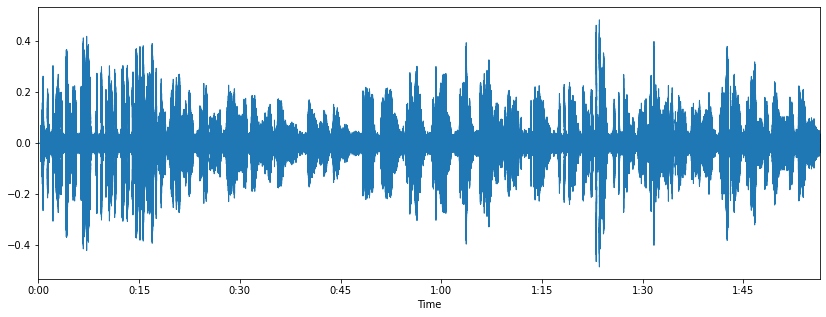

(2565691,) 22050


In [1]:
import wave
import numpy as np
import librosa
from IPython.display import display,Audio
import matplotlib.pyplot as plt
import librosa.display

display(Audio("./Jab_tak.wav"))

data,sampling_rate = librosa.load("./Jab_tak.wav")
plt.figure(figsize=(14,5))
librosa.display.waveplot(data,sr=sampling_rate)
plt.show()
print(data.shape,sampling_rate)

In [112]:
input_wave = wave.open('./Jab_tak.wav', 'r')

# Set the parameters for the output file.
input_parameters = list(input_wave.getparams())
print("\nno:of channels: ",input_parameters[0])
print("sample width: ",input_parameters[1])
print("frame rate: ",input_parameters[2])
print("no:of frames: ",input_parameters[3],"\n")

input_parameters[3] = 0  # The number of samples will be set by writeframes.
input_parameters = tuple(input_parameters)

# initialize output wave parameters
output_wave = wave.open('pitch1.wav', 'w')
output_wave.setparams(input_parameters)

fr = 10000
sz = input_wave.getframerate()//fr  # Read and process 1/fr second at a time. A larger number for fr means less reverb.

c = int(input_wave.getnframes()/sz)  # count of the whole file
shift = 100//fr  # shifting 100 Hz

for num in range(c):
  # Read the data, split it in left and right channel
  da = np.frombuffer(input_wave.readframes(sz), dtype=np.int16)
  left, right = da[0::2], da[1::2]  # left and right channel

  # Extract the frequencies using the Fast Fourier Transform built into numpy.
  lf, rf = np.fft.rfft(left), np.fft.rfft(right)

  # Roll the array to increase the pitch.
  lf, rf = np.roll(lf, shift), np.roll(rf, shift)

  # The highest frequencies roll over to the lowest ones. That's not what we want, so zero them.  
  lf[0:shift], rf[0:shift] = 0, 0

  # use the inverse Fourier transform to convert the signal back into amplitude.
  nl, nr = np.fft.irfft(lf), np.fft.irfft(rf)

  # Combine the two channels.
  ns = np.column_stack((nl, nr)).ravel().astype(np.int16)

  # Write the output data.
  output_wave.writeframes(ns.tobytes())

# Close the files when all frames are processed.
input_wave.close()
output_wave.close()


no:of channels:  1
sample width:  2
frame rate:  48000
no:of frames:  5585176 



KeyboardInterrupt: ignored

(38507,) 22050


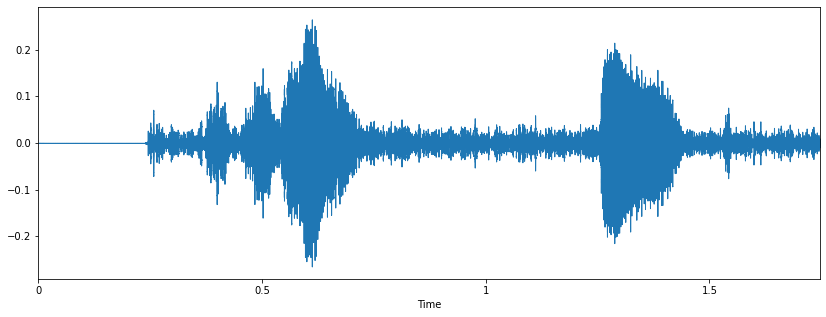

In [2]:
display(Audio("./pitch1.wav"))

output,sampling_rate = librosa.load("./pitch1.wav")
print(output.shape,sampling_rate)

plt.figure(figsize=(14,5))
librosa.display.waveplot(output,sr=sampling_rate)
plt.show()

## Familize python tools for speech processing


### 1. display and play

In [ ]:
from IPython.display import display,Audio

display(Audio("./Jab_tak.wav"))

In [ ]:
from IPython.display import display,Audio

display(Audio("./mudhal_nee_mudivum_nee.wav"))

### 2. Read or write audiofiles

In [ ]:
import soundfile as sf

data, sr = sf.read("./Jab_tak.wav")
print(data.shape,sr)

sf.write("new_file.flac",data,sr)

### 3. Read or write wavefiles

In [ ]:
import wave

In [ ]:
obj=wave.open("./kando_kando.wav","r")

#open wave file
print("channels: ",obj.getnchannels())
print("sample width: ",obj.getsampwidth())
print("frame rate: ",obj.getframerate())
print("number of frames: ",obj.getnframes())
print("parameters: ",obj.getparams())
frames=obj.readframes(obj.getnframes())
obj.close()


In [ ]:
# write to file
sr=16000
obj=wave.open("./edited/kando_kando.wav","w")
obj.setnchannels(1)
obj.setsampwidth(2)
obj.setframerate(sr)
obj.writeframes(frames)
obj.close()

### 4. PyAudio - record mic and I/O lib
### 5. sounddevice - record mic and playaudio

### 6. Librosa - music and audio analysis

In [ ]:
import librosa

In [ ]:
data,sr = librosa.load("./Jab_tak.wav",sr=48000)
print(data.shape,sr)

In [ ]:
import matplotlib.pyplot as plt
import librosa.display

plt.figure(figsize=(14,5))
librosa.display.waveplot(data,sr=sr)
plt.show()

In [ ]:
#spectrogram
X = librosa.stft(data)
Xdb = librosa.amplitude_to_db(abs(X))

plt.figure(figsize=(14,5))
librosa.display.specshow(Xdb, sr=sr, x_axis='time',y_axis='hz')
plt.colorbar()
plt.show()

### 7. manipulate audio mp3 and others

In [ ]:
!pip install pydub

In [ ]:
import pydub

In [ ]:
from pydub import AudioSegment
from pydub.playback import play
 
tape = AudioSegment.from_file('./malare.wav', format='wav')

In [ ]:
play(tape)

In [ ]:
from pydub import AudioSegment

audio1 = AudioSegment.from_wav('./Jab_tak.wav')
audio2 = AudioSegment.from_wav('./kando_kando.wav')
# audio = audio1 * audio2 #audio mixing
# audio = audio1 + audio2 #audio appending
audio = audio1 * audio2
# audio = audio + 5 #boost volume by 5db
# audio = audio * 2 #repeat audio twice
audio = audio.fade_in(2000) #2 sec fade in
# audio = audio.speedup(playback_speed=1.5) #playback_Speed x 1.5
audio.export('edited/Jab_tak.wav', format='wav')

In [ ]:
display(Audio("./edited/Jab_tak.wav"))

### 8. Pytorch audio

In [ ]:
import torch
import torchaudio

waveform, sample_rate = torchaudio.load("./malare.wav")

waveform.shape, sample_rate

In [ ]:
#Resampling

import torchaudio.transforms as T
import torchaudio.functional as F

waveform, sample_rate = torchaudio.load("./malare.wav")

resample_rate = 96000

resampledwaveform1 = F.resample(waveform, sample_rate, resample_rate, lowpass_filter_width=12)
resampledwaveform2 = F.resample(waveform, sample_rate, resample_rate, resampling_method="kaiser_window")